# Current injection experiments

In [1]:
import Interface as I
# set up cell. This creates a lot of (interesting) diagnostic output. Remove the context manager to see it
from simrun2.utils import scale_apical
import Interface as I
from getting_started import getting_started_dir # path to getting started folder

cell_param = I.os.path.join(getting_started_dir, \
                            'biophysical_constraints', \
                            '86_CDK_20041214_BAC_run5_soma_Hay2013_C2center_apic_rec.param')
cell_param = I.scp.build_parameters(cell_param) # this is the main method to load in parameterfiles
cell = I.scp.create_cell(cell_param.neuron, scaleFunc = scale_apical)

trying to connect to distributed locking server {'type': 'file'}
[WARNING] distributed_lock: Using file based locking. Please be careful on nfs mounts as file based locking has issues in this case.
[INFO] ISF: Current version: heads/publish+0.geb0d6a82.dirty
[INFO] ISF: Current pid: 169136
[INFO] mechanisms: Loading mechanisms:


--No graphics will be displayed.





[INFO] ISF: Loaded modules with __version__ attribute are:
IPython: 8.12.3, Interface: heads/publish+0.geb0d6a82.dirty, PIL: 8.2.0, _csv: 1.0, _ctypes: 1.1.0, _curses: b'2.2', _decimal: 1.70, argparse: 1.1, attr: 20.3.0, backcall: 0.2.0, blake3: 0.3.3, blosc: 1.10.2, bluepyopt: 1.9.126, bottleneck: 1.3.2, cffi: 1.14.3, click: 7.1.2, cloudpickle: 1.6.0, colorama: 0.4.4, comm: 0.2.1, csv: 1.0, ctypes: 1.1.0, cycler: 0.10.0, cytoolz: 0.11.0, dash: 2.9.3, dask: 2.30.0, dateutil: 2.8.2, deap: 1.3, debugpy: 1.8.0, decimal: 1.70, decorator: 4.4.2, distributed: 2.30.1, distutils: 3.8.5, executing: 2.0.1, filelock: 3.0.12, flask: 1.1.2, flask_cors: 4.0.0, frozendict: 2.3.8, fsspec: 0.8.3, future: 0.18.2, gevent: 20.9.0, greenlet: 0.4.17, ipaddress: 1.0, ipykernel: 6.29.0, ipython_genutils: 0.2.0, ipywidgets: 7.5.1, itsdangerous: 1.1.0, jedi: 0.17.1, jinja2: 3.0.3, joblib: 1.3.2, json: 2.0.9, jupyter_client: 8.6.0, jupyter_core: 5.7.1, kiwisolver: 1.3.0, llvmlite: 0.34.0, logging: 0.5.1.2, ma

Let's figure out some general properties of the cell

In [2]:
print('total length = {:.0f} micron'.format(sum([sec.L for sec in cell.sections])))
print('total dendritic length = {:.0f} micron'.format(sum([sec.L for sec in cell.sections \
                                                           if sec.label in ['Soma', 'Dendrite', 'ApicalDendrite']])))
print('soma area = {:.0f} micron^2'.format(sum([sec.area for sec in cell.sections if sec.label == 'Soma'])))
print('apical dendrite area = {:.0f} micron^2'.format(sum([sec.area for sec in cell.sections \
                                                           if sec.label == 'ApicalDendrite'])))

total length = 16340 micron
total dendritic length = 15290 micron
soma area = 916 micron^2
apical dendrite area = 27212 micron^2


<a id='WhyWeNeedScaling'></a>
The respective hoc morphology has a very thin apical dendrite which does not allow electric coupling between apical dendrite and soma. We figured that it is necessary to scale up the diameter of the trunc.

In [3]:
# load scaled hoc morphology
cell_param.neuron.filename = I.os.path.join(getting_started_dir, 'anatomical_constraints', \
                            '86_L5_CDK20041214_nr3L5B_dend_PC_neuron_transform_registered_C2center_scaled_diameters.hoc')
with I.silence_stdout:
    cell = I.scp.create_cell(cell_param.neuron)
print('apical dendrite area = {:.0f} micron^2'.format(sum([sec.area for sec in cell.sections \
                                                           if sec.label == 'ApicalDendrite'])))

apical dendrite area = 27212 micron^2


Let's quickly see what this cell looks like

In [4]:
from visualize.cell_morphology_visualizer import CellMorphologyVisualizer
import matplotlib
%matplotlib inline
cmv = CellMorphologyVisualizer(cell)
fig = cmv.plot()

TypeError: argument of type 'module' is not iterable

Now, we put a pipette at the soma of the cell and inject a short rectangular current

In [7]:
import neuron
h = neuron.h

In [8]:
iclamp = h.IClamp(0.5, sec=cell.soma)
iclamp.delay = 150 # [ms] give the cell time to reach steady state
iclamp.dur = 5 # [ms] rectangular pulse
iclamp.amp = 1.9 # [nA]

CPU times: user 141 ms, sys: 0 ns, total: 141 ms
Wall time: 145 ms


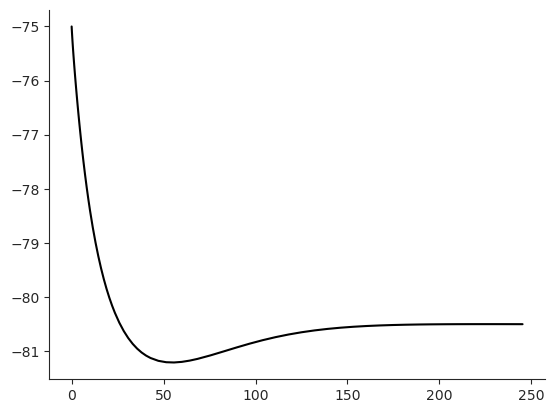

In [6]:
%time I.scp.init_neuron_run(cell_param.sim, vardt=True) # run the simulation 
%matplotlib inline
I.sns.set_style('ticks')
I.plt.plot(cell.tVec, cell.soma.recVList[0], c = 'k')
I.sns.despine()

How does the cell respond to different amplitudes of the step current?

In [9]:
cell_param.sim.tStop = 3000
iclamp.dur = 2000
iclamp.delay = 500
simresult = {}
for amp in [0.619, 0.793, 1.507]:
    iclamp.amp = amp
    I.scp.init_neuron_run(cell_param.sim, vardt=True)
    simresult[amp] = I.np.array(cell.tVec), I.np.array(cell.soma.recVList[0])

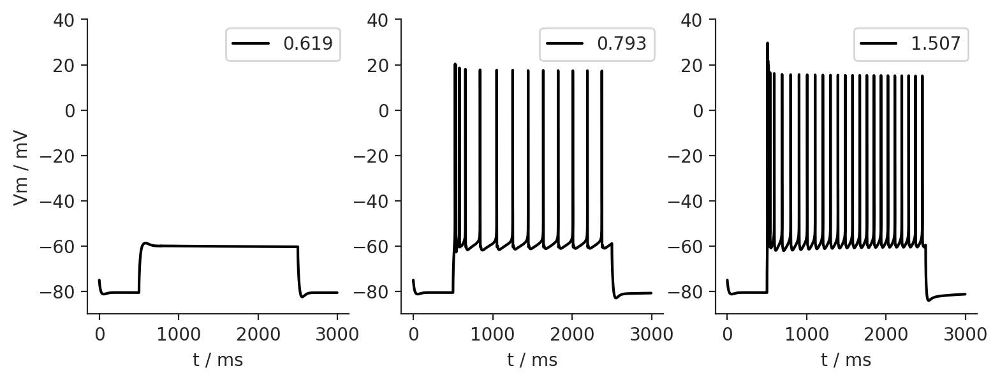

In [10]:
fig = I.plt.figure(figsize = (9,3), dpi = 200)
for lv, k in enumerate(sorted(simresult.keys())):
    ax = fig.add_subplot(1,3,lv+1)
    ax.plot(*simresult[k], label = k, c = 'k')
    ax.legend(loc = 'upper right')
    ax.set_ylim([-90, 40])
    ax.set_xlabel('t / ms')
    if lv == 0:
        ax.set_ylabel('Vm / mV')
I.sns.despine()

Now let's place a pipette on the apical trunk at a soma distance of 620 microns and inject current synchronously at this position and at the soma. For the current at the soma, we choose a rectangular pulse again. The current at the apical injection site should resemble the shape of a evoked post synaptic potential (epsp). Have a look at the folder mechanisms/synapses to see how epsp is implemented in hoc code.

In [11]:
# map between sections and somadistance
sec_dist_dict = {cell.distance_to_soma(sec, 1.0): sec for sec in cell.sections}

def get_section_at_distance(cell, dist):
    dummy = {k - dist: v for k,v in sec_dist_dict.items() if k > dist}
    closest_sec = dummy[min(dummy)]
    x = (dist - cell.distance_to_soma(closest_sec, 0.0)) / closest_sec.L
    return x, closest_sec

In [12]:
cell_param.sim.tStop = 500
x, sec = get_section_at_distance(cell, 620)

iclamp = h.IClamp(0.5, sec=cell.soma)
iclamp.delay = 295 # give the cell time to reach steady state
iclamp.dur = 5 # 5ms rectangular pulse
iclamp.amp = 1.9 # 1.9 ?? todo ampere

iclamp2 = h.epsp(x, sec=sec)
iclamp2.onset = 300
iclamp2.imax = 0.5
iclamp2.tau0 = 1.0 # rise time constant
iclamp2.tau1 = 5 # decay time constant
cell.iclamp2 = iclamp2

%time I.scp.init_neuron_run(cell_param.sim, vardt=True) # run the simulation 

CPU times: user 1.1 s, sys: 2.96 ms, total: 1.1 s
Wall time: 1.1 s


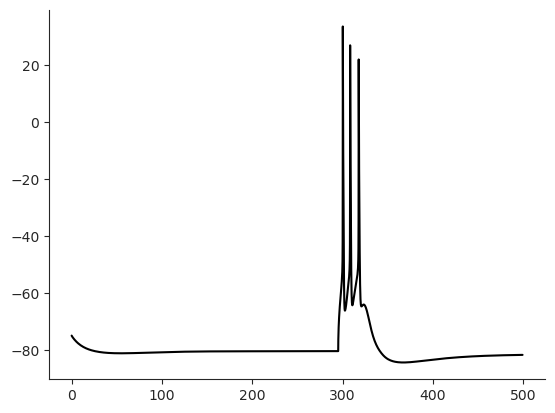

In [13]:
I.plt.plot(cell.tVec, cell.soma.recVList[0], c = 'k')
I.sns.despine()

So far, we have only visualized the somatic membrane potential. Now, we create a short animation, where the whole dendrite is visualized (x-axis: soma distance of dendrite segment, y-axis: Vm)

In [14]:
import os
db = I.DataBase('{}/labs/getting_started_db/'.format(os.environ['HOME'])) # create a DataBase to save .png-frames of the animation

see section [DataBase](#DataBase) for a more detailed descritpion

In [15]:
from IPython import display


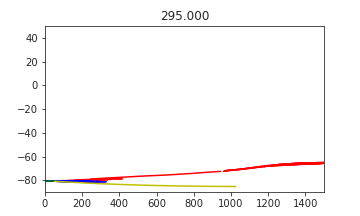
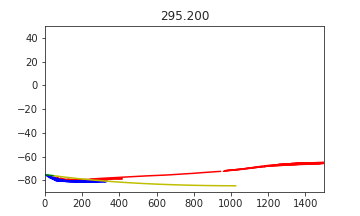
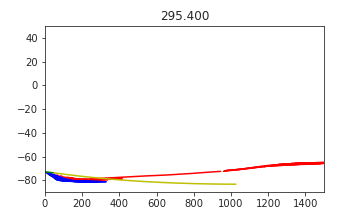
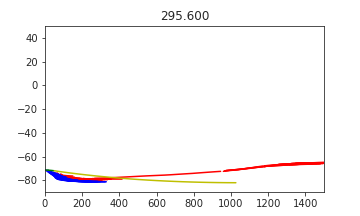
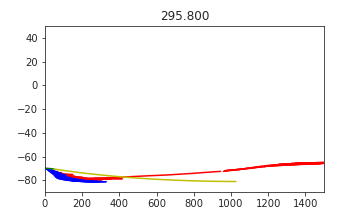
...
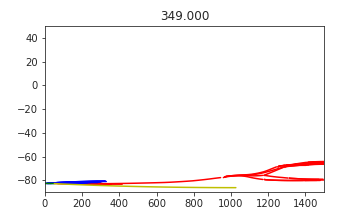
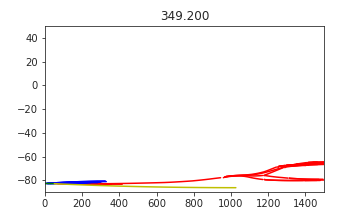
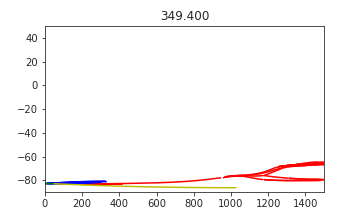
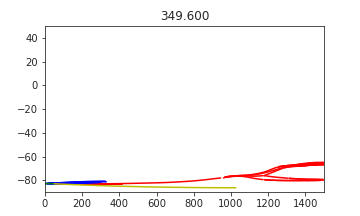
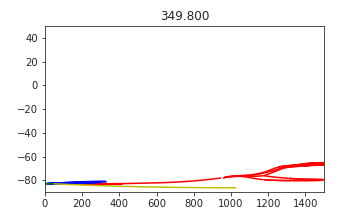

In [16]:
if not 'burst_trail_video' in db.keys():
    I.scp.init_neuron_run(cell_param.sim, vardt=False) # fixed step size necessary for animation
    I.cell_to_animation(cell, \
                        xlim = [0,1500], \
                        ylim = [-90, 50], \
                        tstart = 295, \
                        tend = 350, \
                        tstep = 0.2, \
                        outdir = db.create_managed_folder('burst_trail_video'))
I.display_animation(db['burst_trail_video'].join('*', '*.png'), embedded=True)

We can also visualize current through ion channels. Let's have a look at the calcium current through low voltage activated calcium channels:


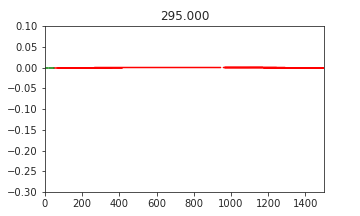
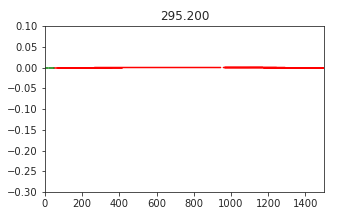
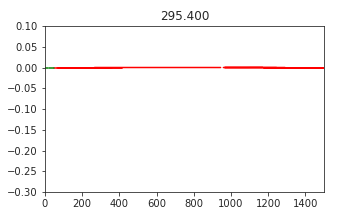
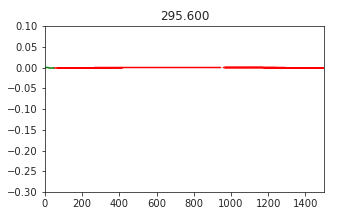
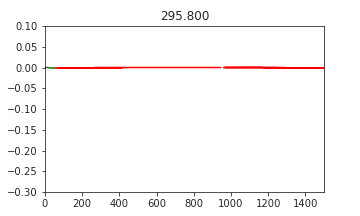
...
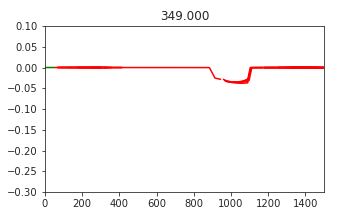
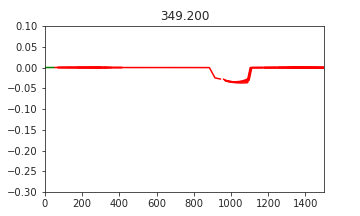
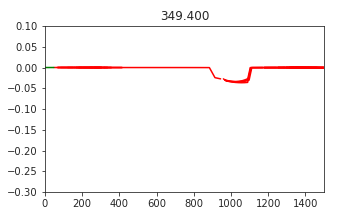
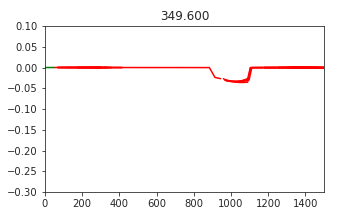
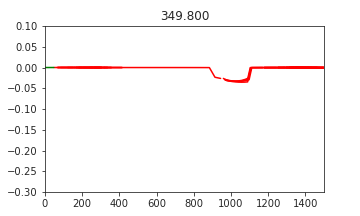

In [17]:
if not 'burst_trail_ca_current_video' in db.keys():
    cell.record_range_var('Ca_LVAst.ica') # have a look at the mechanisms folder to find available range vars
    I.scp.init_neuron_run(cell_param.sim, vardt=False)
    I.cell_to_animation(cell, \
                        xlim = [0,1500], \
                        ylim = [-0.3, 0.1], \
                        tstart = 295, \
                        tend = 350, \
                        tstep = 0.2, \
                        outdir = db.create_managed_folder('burst_trail_ca_current_video'),\
                        range_vars = 'Ca_LVAst.ica')    
I.display_animation(db['burst_trail_ca_current_video'].join('*', '*png'), embedded = True)

See section [display_animations](#display_animations) for caveats of creating animations


If you want to visualize the entire dendritic tree, that's also possible, although a bit slower. Here, we use Dask to parallellize frame generation of the membrane voltage across the entire dendritic tree.


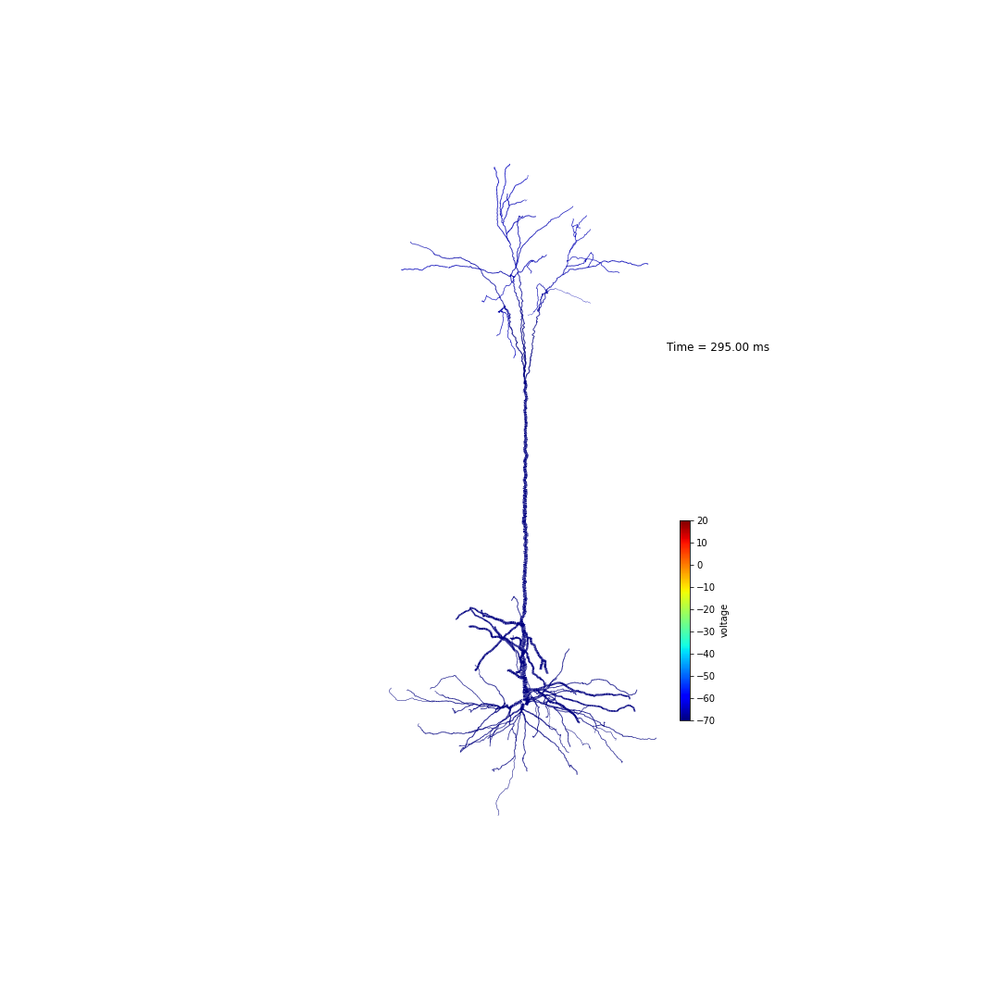
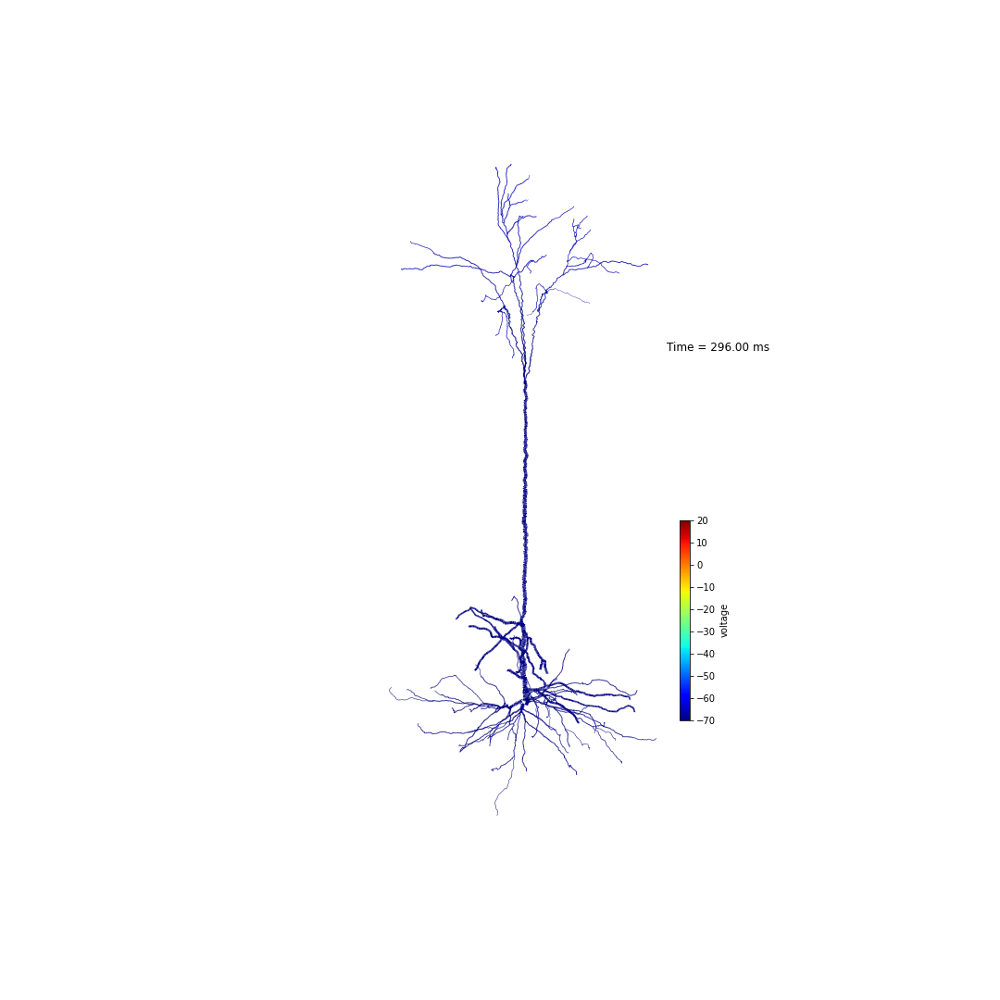
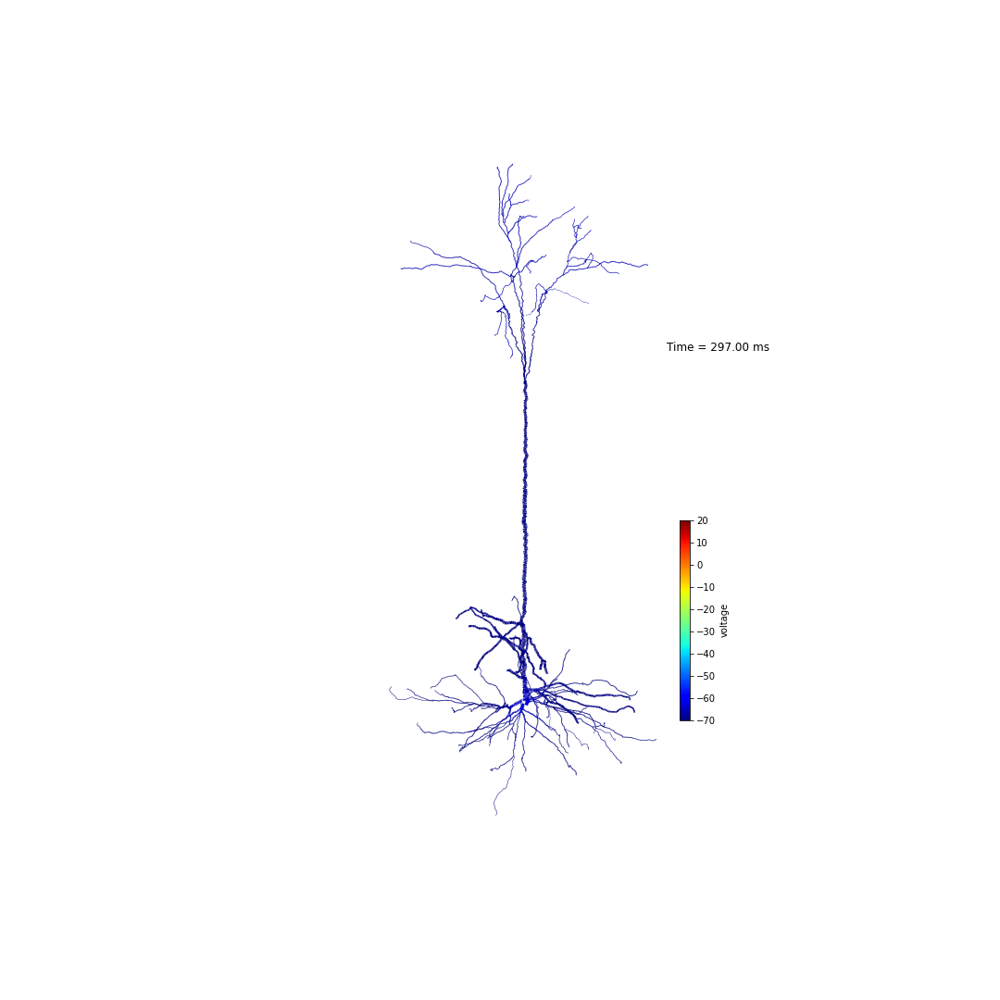
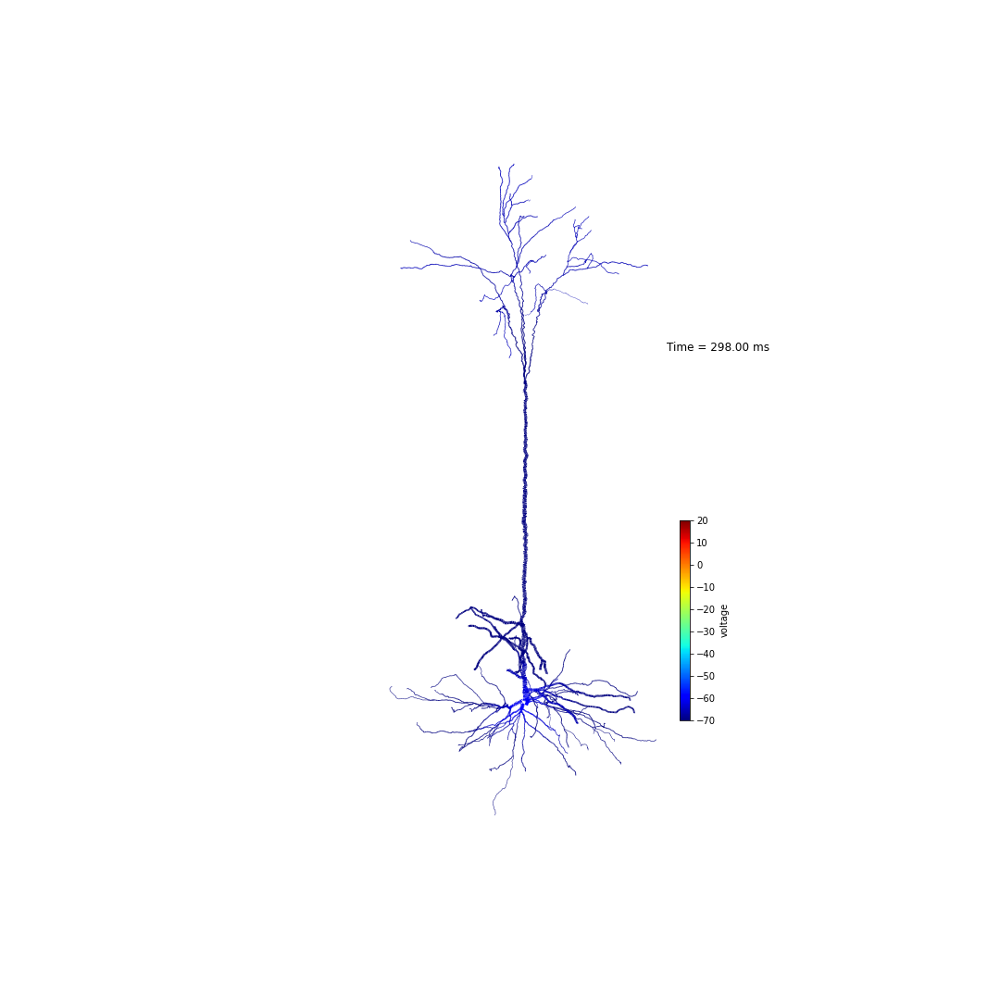
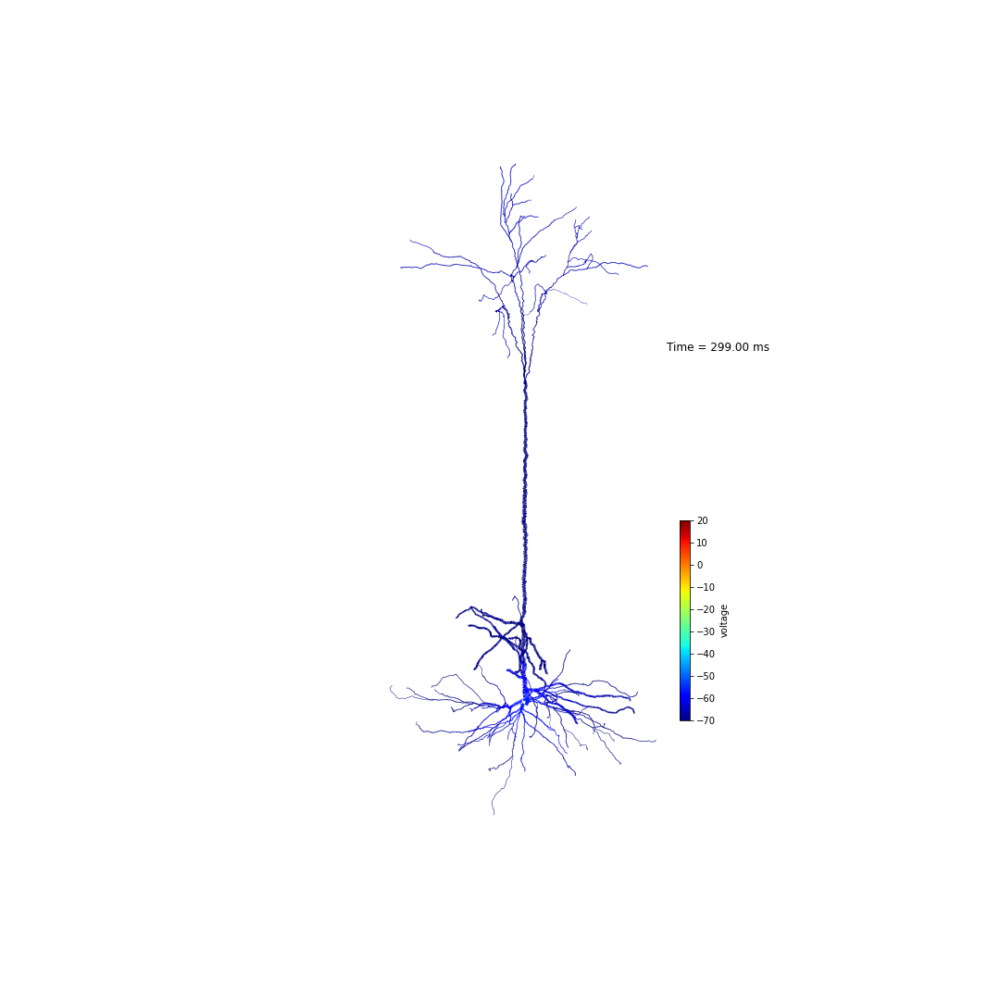
...
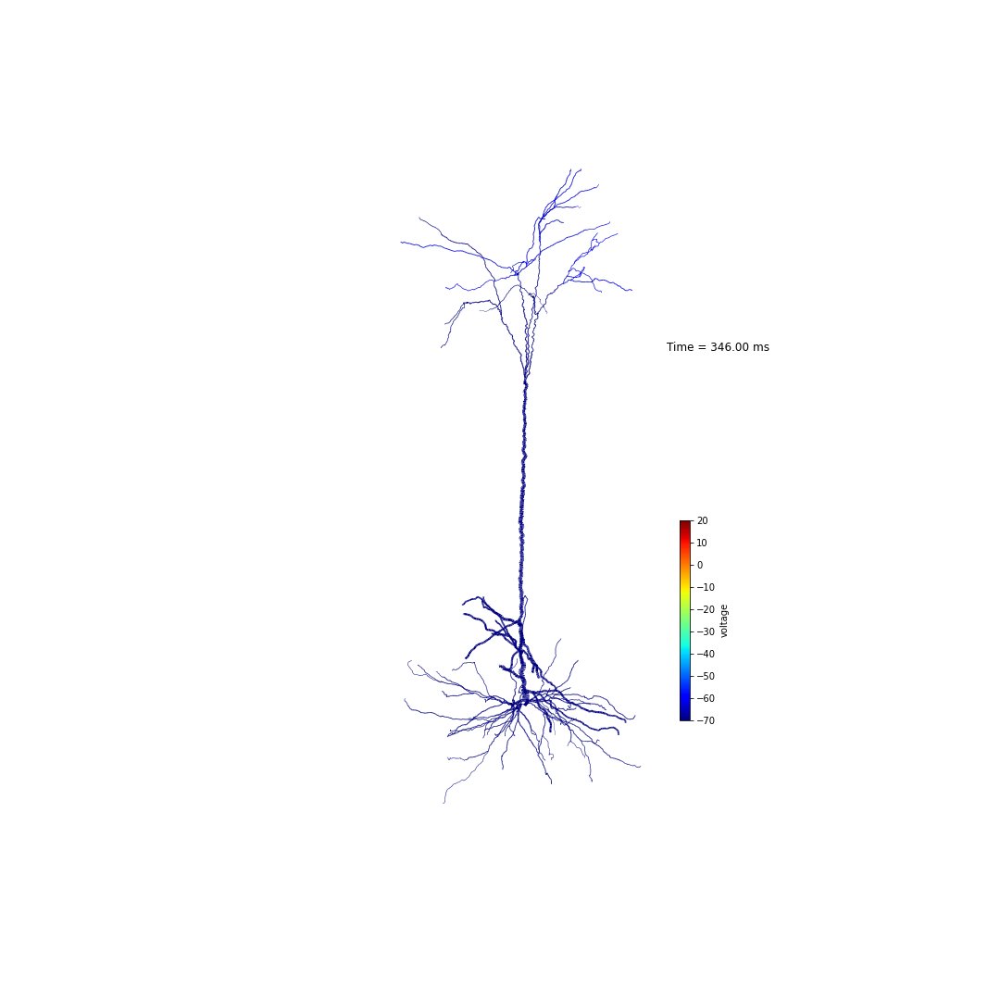
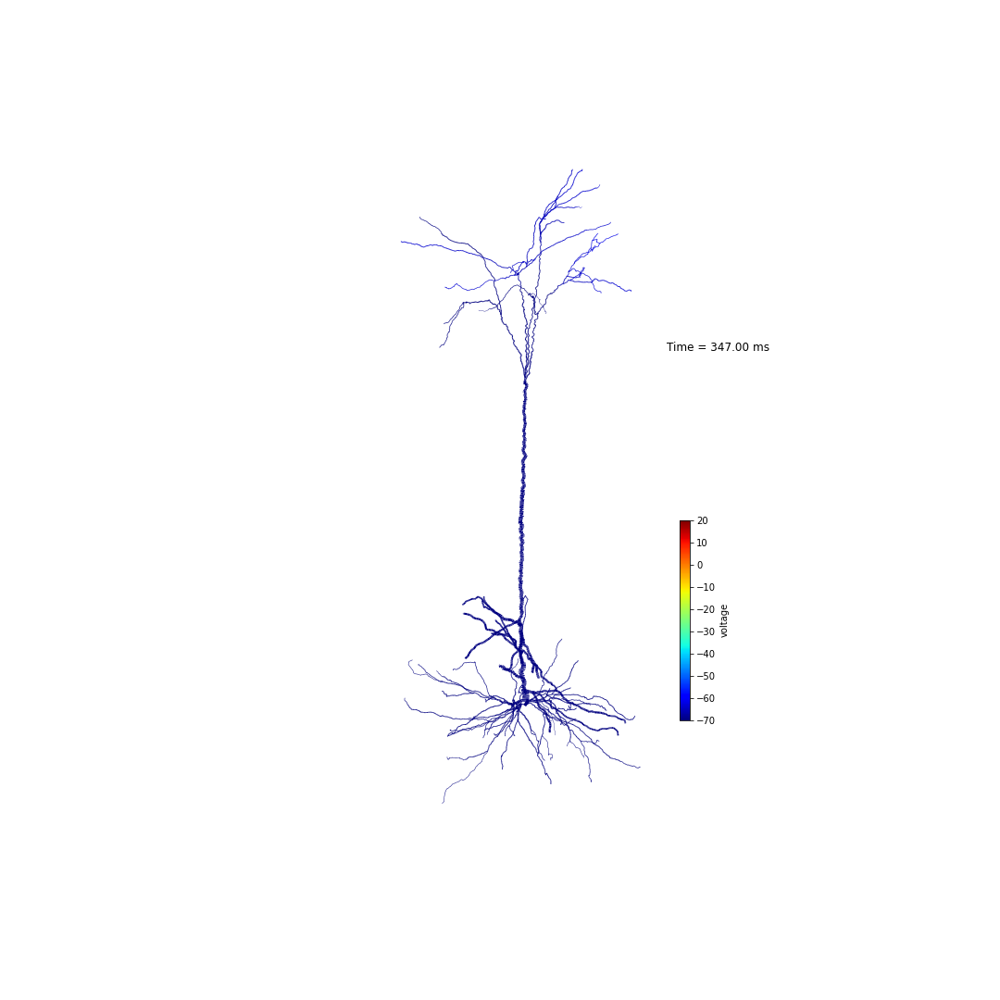
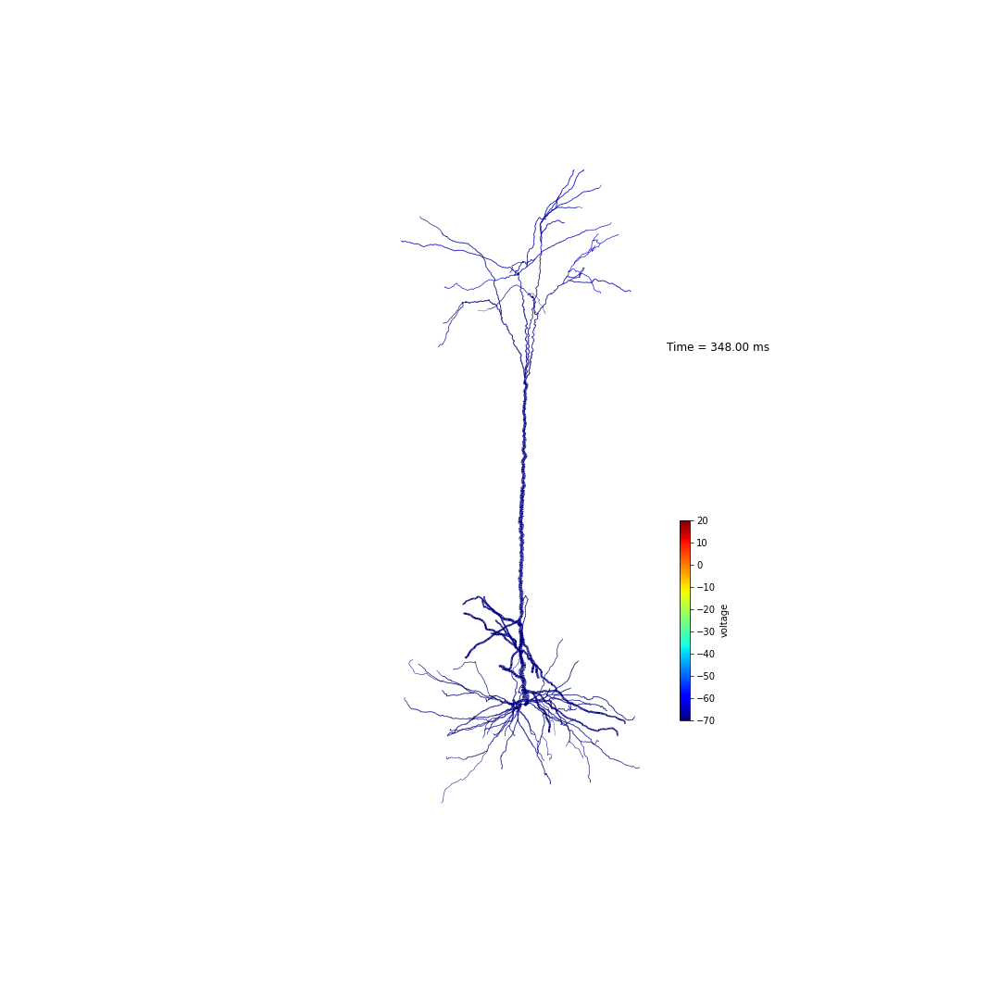
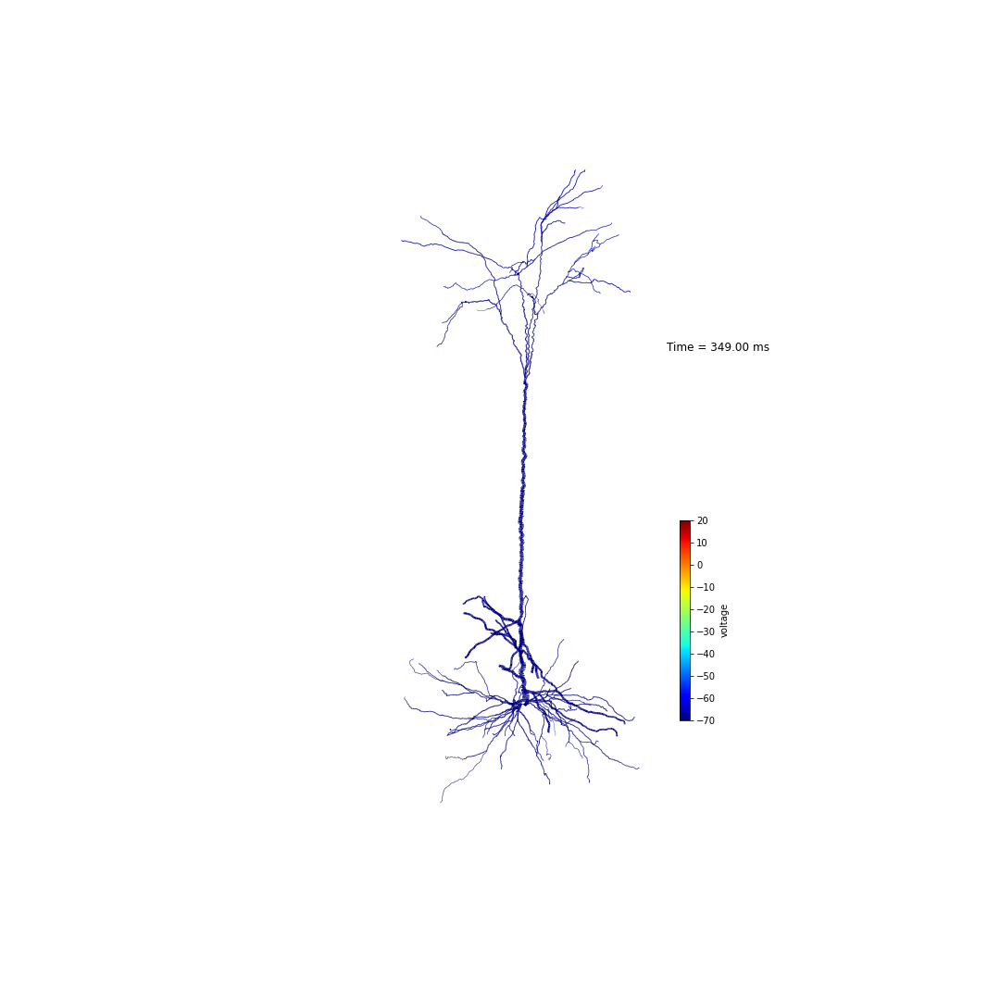
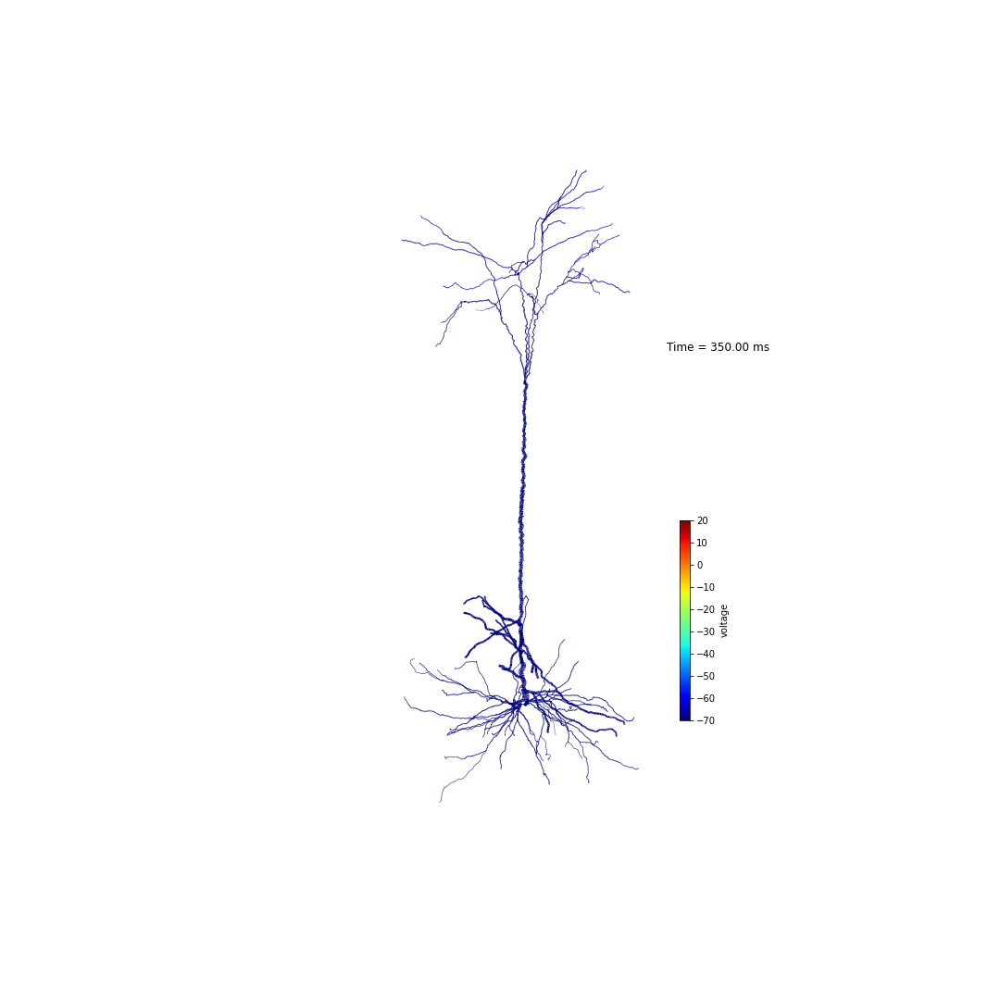

In [328]:
client = I.get_client()
client.restart()
outdir = I.os.path.join(db.basedir, 'burst_trail_video_3d')

# To re-create: remove outdir
# if I.os.path.exists(outdir):
#     I.shutil.rmtree(outdir, ignore_errors=True)
    
cmv = I.CellMorphologyVisualizer(
    cell, 
    t_start=295, # Don't load all simulation data, only the interesting part
    t_end=350, # these are in [ms]
    t_step=1)
cmv.display_animation(
    images_path=outdir,
    show_legend=True,
    color="voltage",
    client=client)

Or visualize current through ion channels.


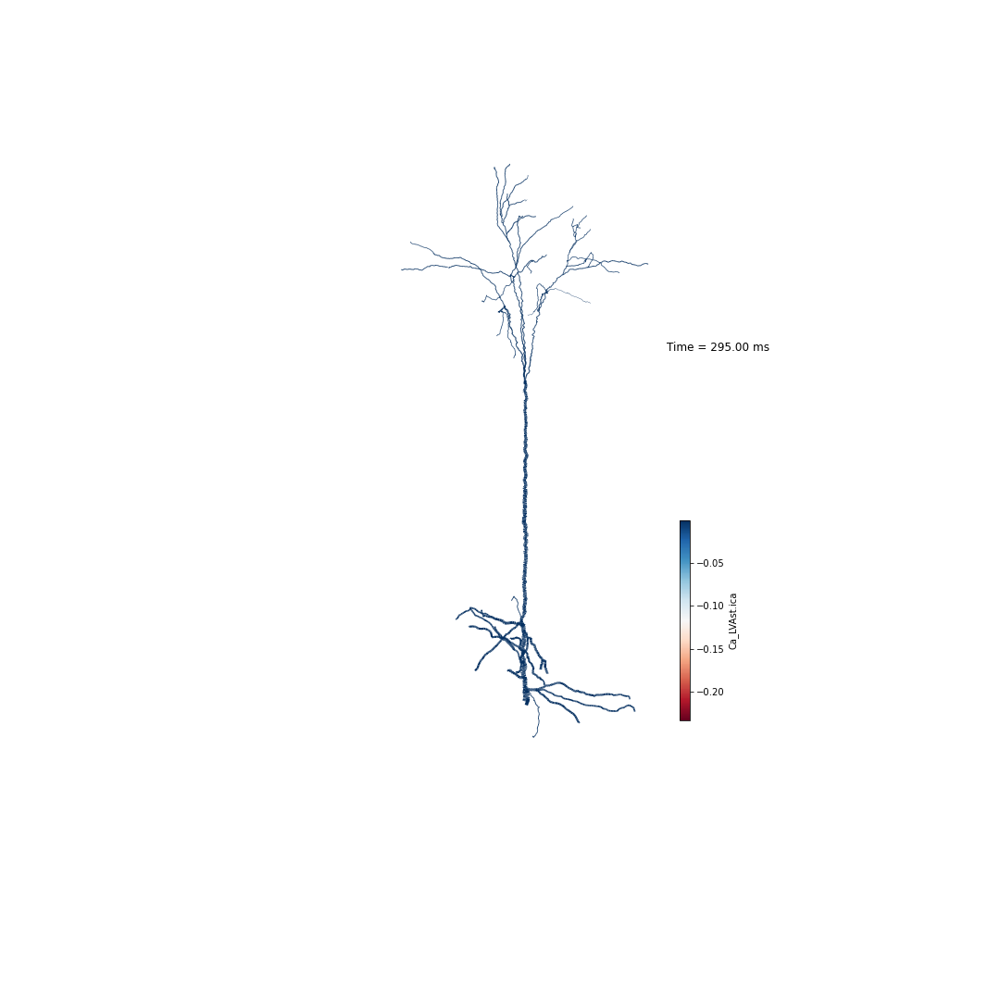
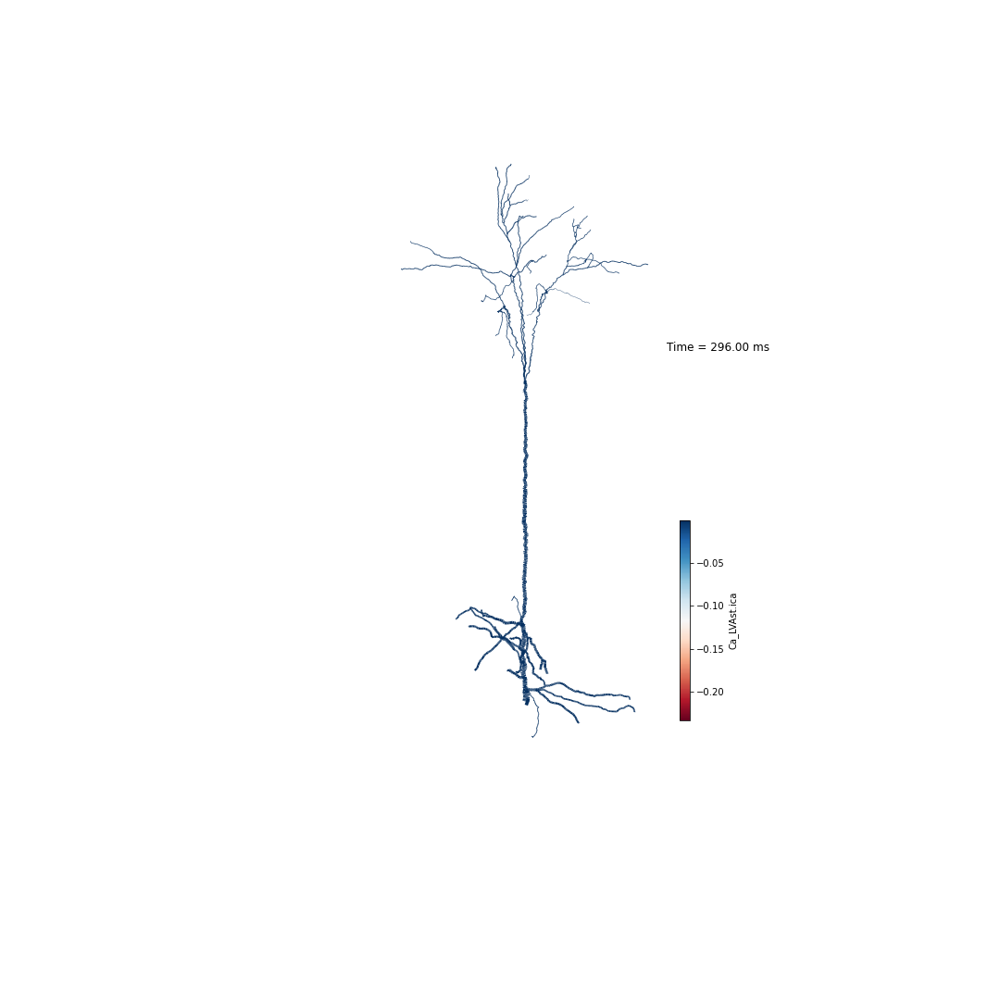
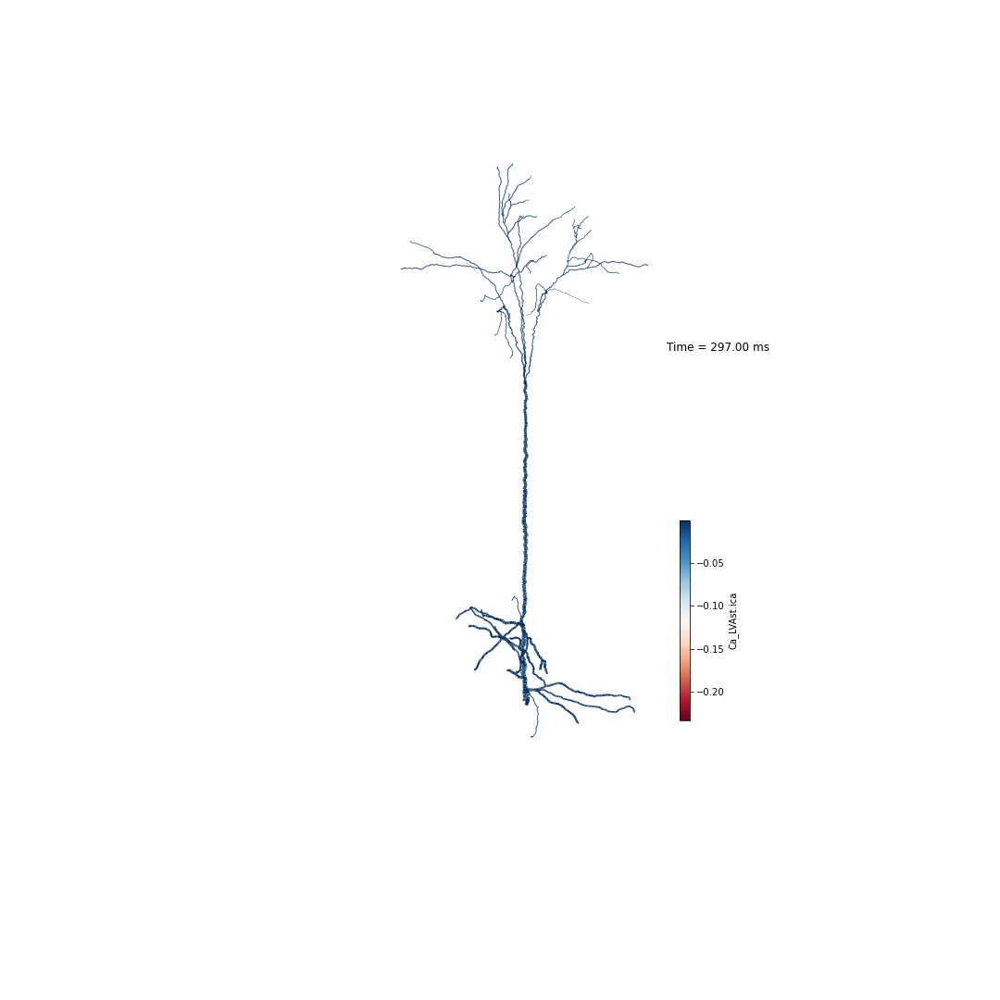
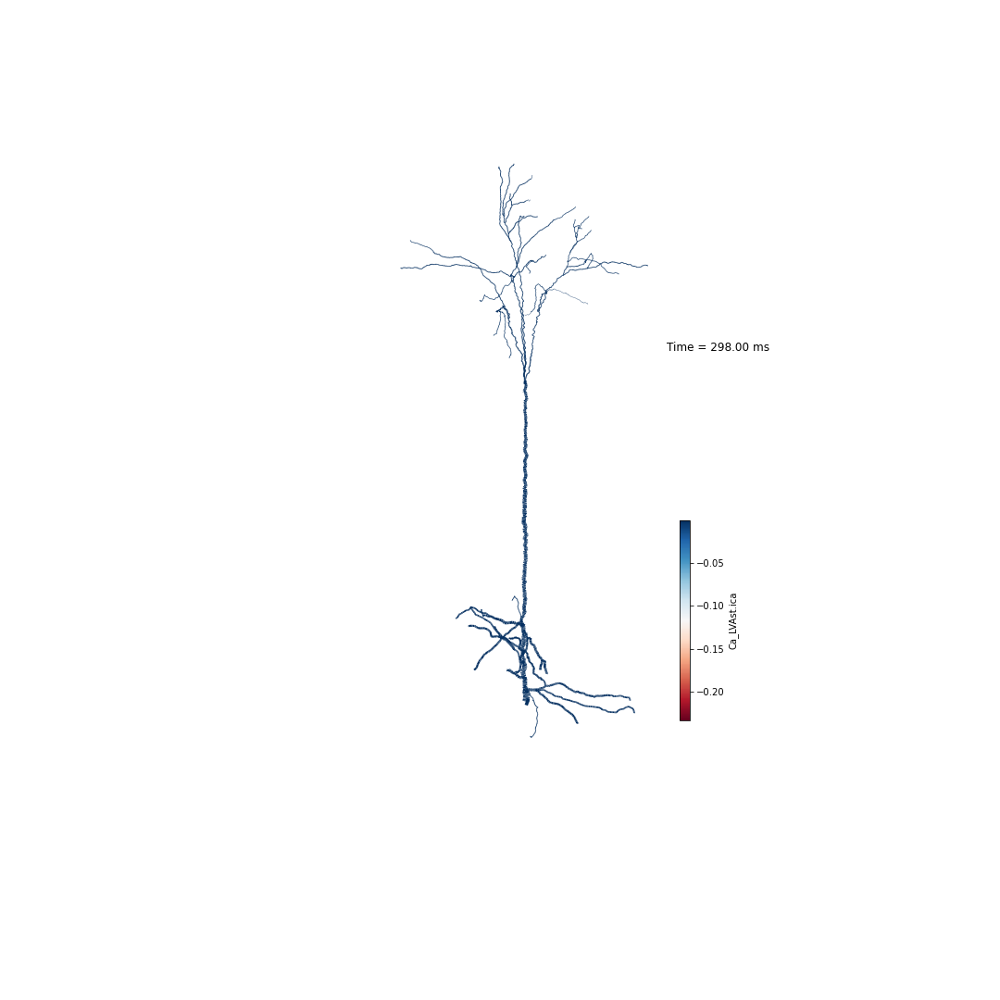
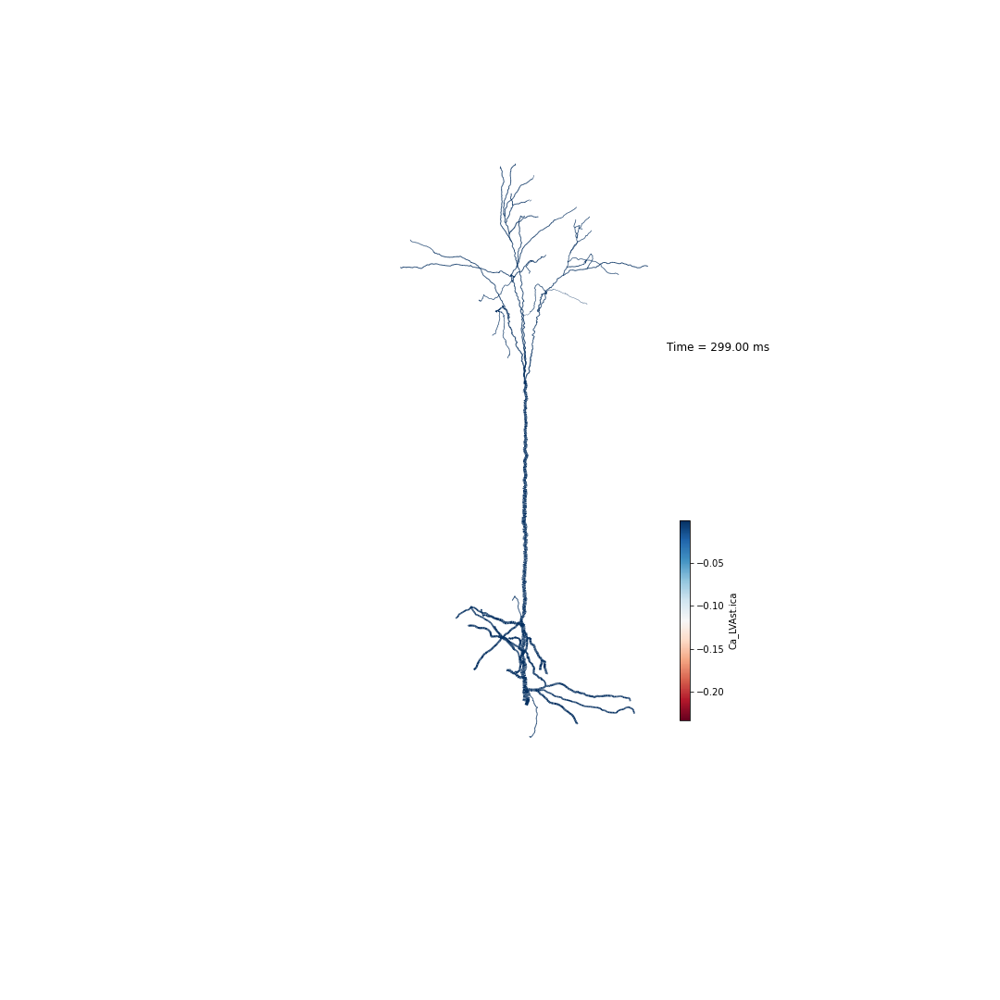
...
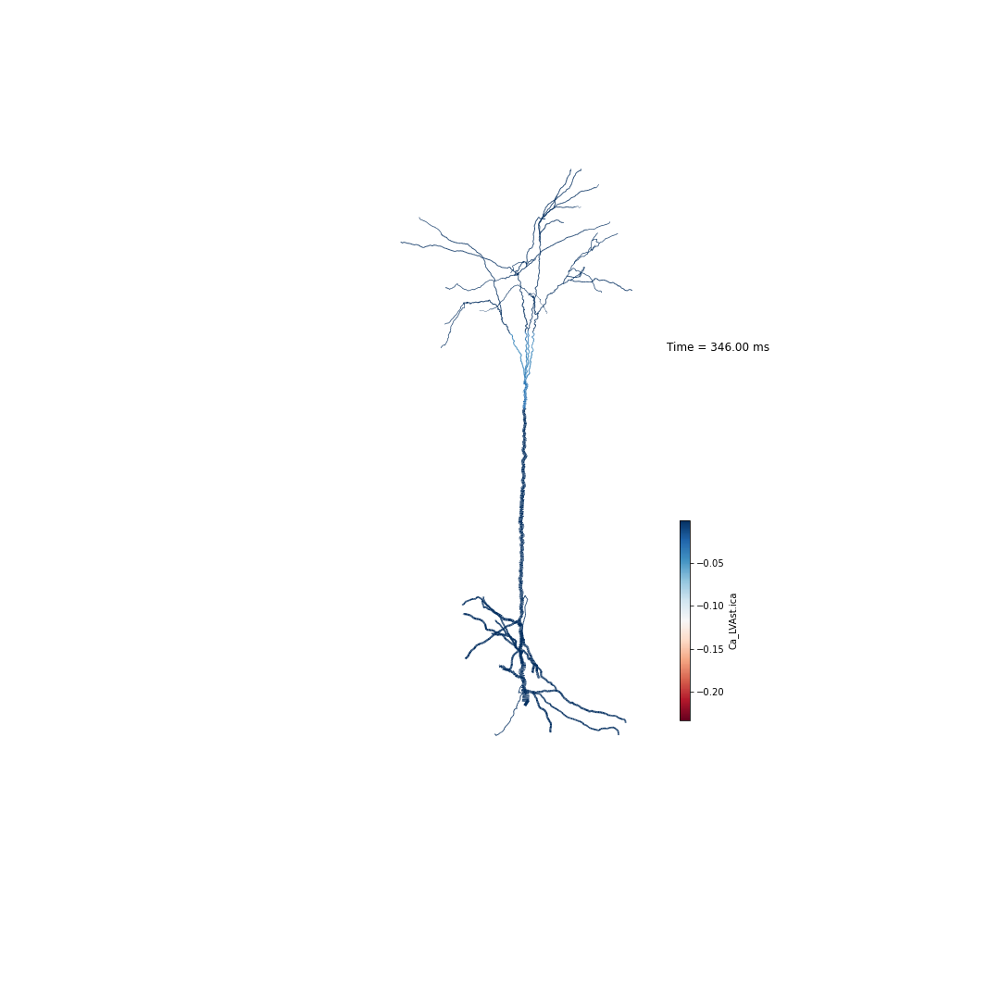
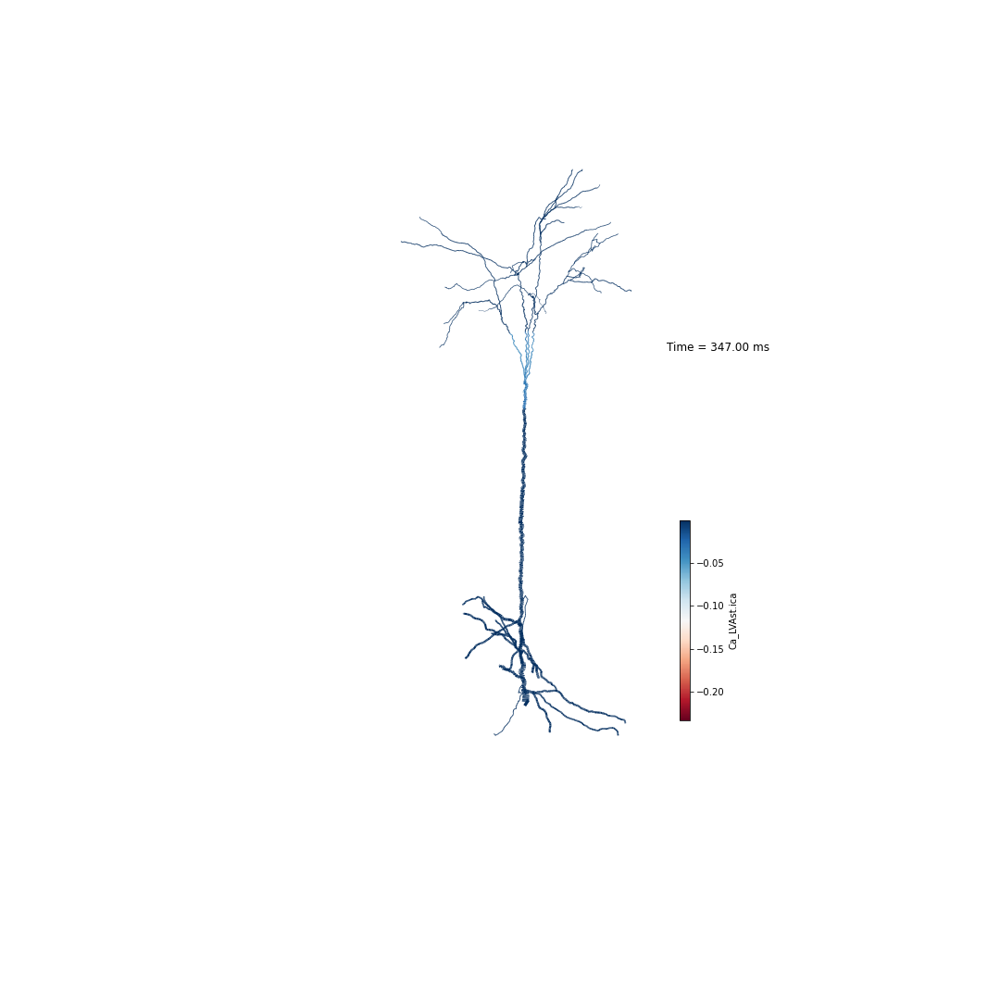
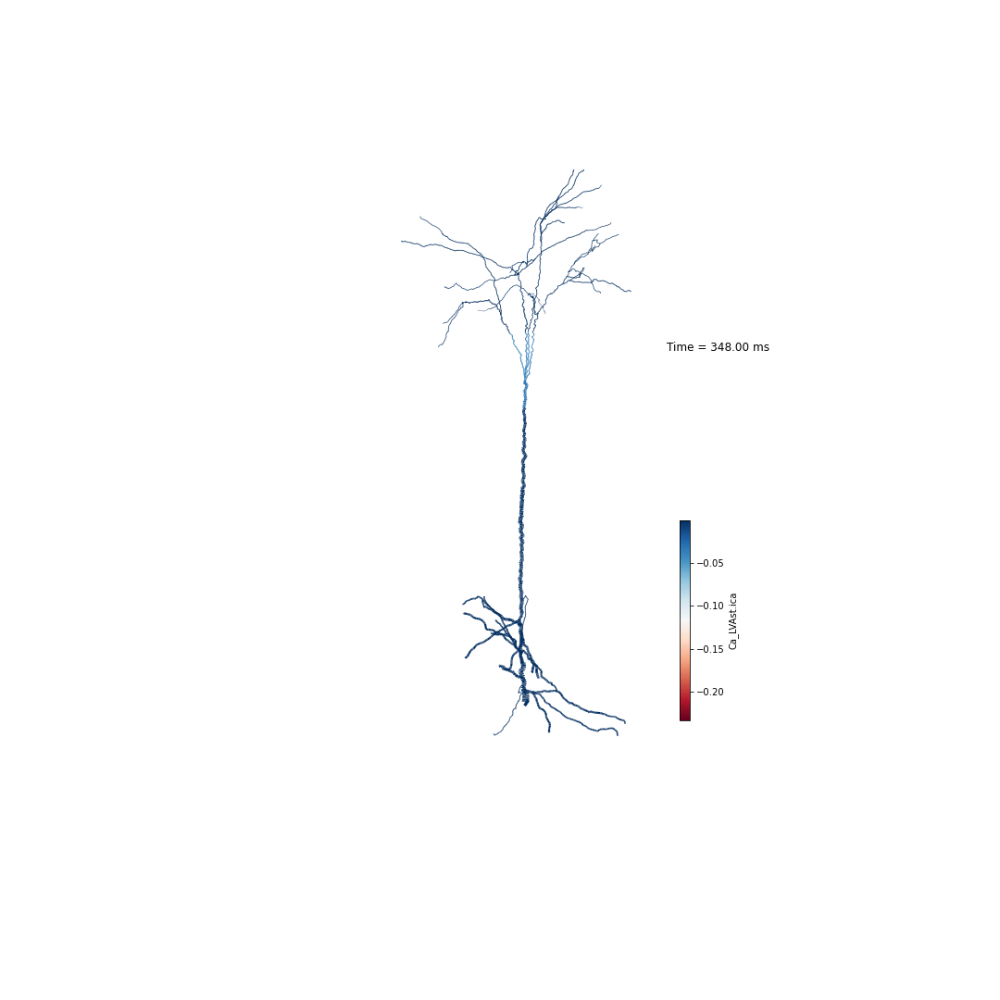
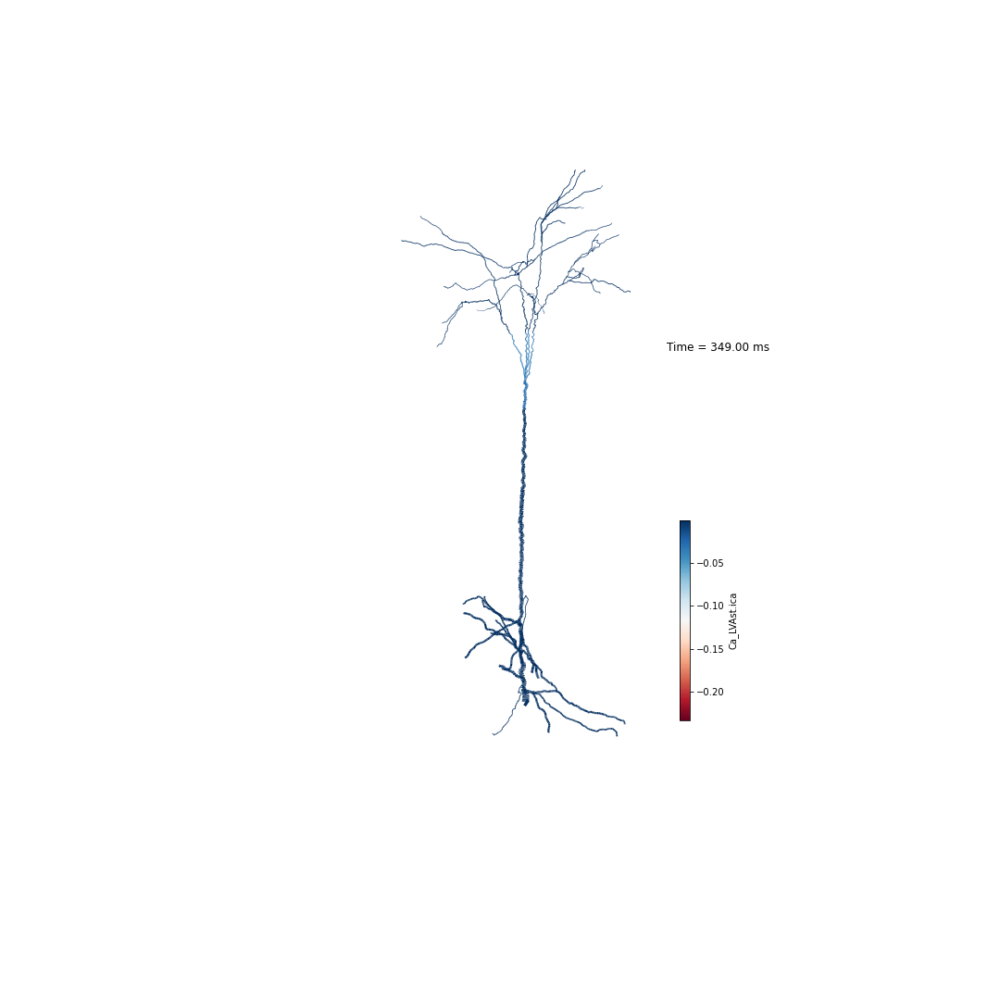
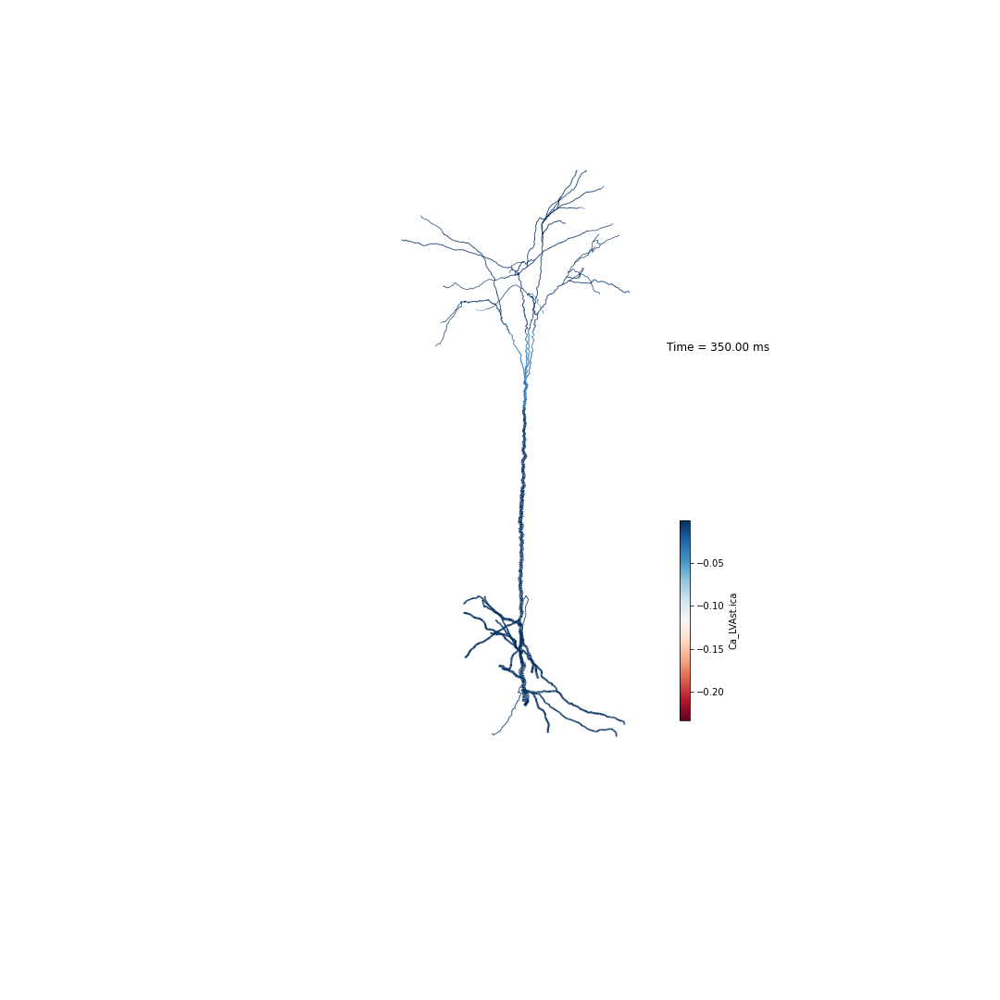

In [327]:
outdir = I.os.path.join(db.basedir, 'Ca_LVAst_video_3d')

# To re-create: remove outdir
# if I.os.path.exists(outdir):
#     I.shutil.rmtree(outdir, ignore_errors=True)
    
cmv.set_cmap("RdBu")  # more visible 
cmv.display_animation(
    images_path=outdir,
    color="Ca_LVAst.ica",
    show_legend=True,
    client=client)